In [2]:
import collections
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import spacy

C:\Users\USER\AppData\Local\Temp\ipykernel_32828\1036500117.py:4: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, f1_score, classification_report, roc_auc_score
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier

In [4]:
train = pd.read_csv('C:/Users/USER/Downloads/DaraSet/train.csv')
test = pd.read_csv('C:/Users/USER/Downloads/DaraSet/test.csv')
sample = pd.read_csv('C:/Users/USER/Downloads/DaraSet/sample_submission.csv')

In [5]:
train.head()

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate
0,0000997932d777bf,Explanation\nWhy the edits made under my usern...,0,0,0,0,0,0
1,000103f0d9cfb60f,D'aww! He matches this background colour I'm s...,0,0,0,0,0,0
2,000113f07ec002fd,"Hey man, I'm really not trying to edit war. It...",0,0,0,0,0,0
3,0001b41b1c6bb37e,"""\nMore\nI can't make any real suggestions on ...",0,0,0,0,0,0
4,0001d958c54c6e35,"You, sir, are my hero. Any chance you remember...",0,0,0,0,0,0


In [19]:
target_columns = list(train.columns.drop(['id', 'comment_text']))
target_columns


['toxic',
 'severe_toxic',
 'obscene',
 'threat',
 'insult',
 'identity_hate',
 'non-toxic',
 'toxicity_type_defined',
 'toxic_undefined',
 'soft_toxic']

In [20]:
train.describe()

,toxic,severe_toxic,obscene,threat,insult,identity_hate,non-toxic,toxicity_type_defined,toxic_undefined,soft_toxic
count,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000,159571.000000
mean,0.095844,0.009996,0.052948,0.002996,0.049364,0.008805,0.898321,0.065914,0.035765,0.005834
std,0.294379,0.099477,0.223931,0.054650,0.216627,0.093420,0.302226,0.248133,0.185703,0.076160
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [21]:
train[target_columns].sum()

toxic                     15294
severe_toxic               1595
obscene                    8449
threat                      478
insult                     7877
identity_hate              1405
non-toxic                143346
toxicity_type_defined     10518
toxic_undefined            5707
soft_toxic                  931
dtype: int64

In [32]:
train['non-toxic'] = 1-train[target_columns].max(axis=1)

train['toxicity_type_defined'] = train[['insult','obscene','identity_hate','threat']].max(axis=1)

train['toxic_undefined'] = 0
train.loc[(train['toxicity_type_defined']==0)&(train['toxic']==1),'toxic_undefined'] = 1

train['soft_toxic'] = 0
train.loc[(train['toxicity_type_defined']==1)&(train['toxic']==0),'soft_toxic'] = 1

analysis_columns = target_columns + ['non-toxic', 'toxic_undefined', 'soft_toxic']

In [33]:
train.loc[(train['toxicity_type_defined'] == 1)&(train['toxic']==0)]

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,non-toxic,toxicity_type_defined,toxic_undefined,soft_toxic
179,006d11791d76b9f3,"REPLY ABOVE:\nThat was me, loser. The UN defin...",0,0,0,0,1,0,0,1,0,1
527,01625cc84c6ef15b,How do you know he is dead. Its just his plan...,0,0,1,0,0,0,0,1,0,1
662,01ccf4d20d31dfbe,Hebrew Name of Lydia \nAppologies to Til Eulen...,0,0,0,0,1,0,0,1,0,1
1232,0350c82d1f207e0e,Bleh. I'm all out of ideas. Is there really so...,0,0,1,0,0,0,0,1,0,1
1351,03aec26f9b6f9ba3,"""\n\n Stop. \n\nStop redirecting the Teddygodz...",0,0,0,0,1,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
158615,f0b46600c7cf2515,"""""""And at least Castro was trying to liberate ...",0,0,1,0,1,0,0,1,0,1
158793,f3d62179cdb93e58,"Hey FayssalFag, will you ever get a life offli...",0,0,1,0,1,0,0,1,0,1
158933,f60a9bd97d717630,Administratore: I need your help to stop DIREK...,0,0,0,0,1,0,0,1,0,1
159103,f896893958bb1cec,"OH DEAR OH DEAR, HOW FUKIN SAD. I WILL REGRET ...",0,0,1,0,0,0,0,1,0,1


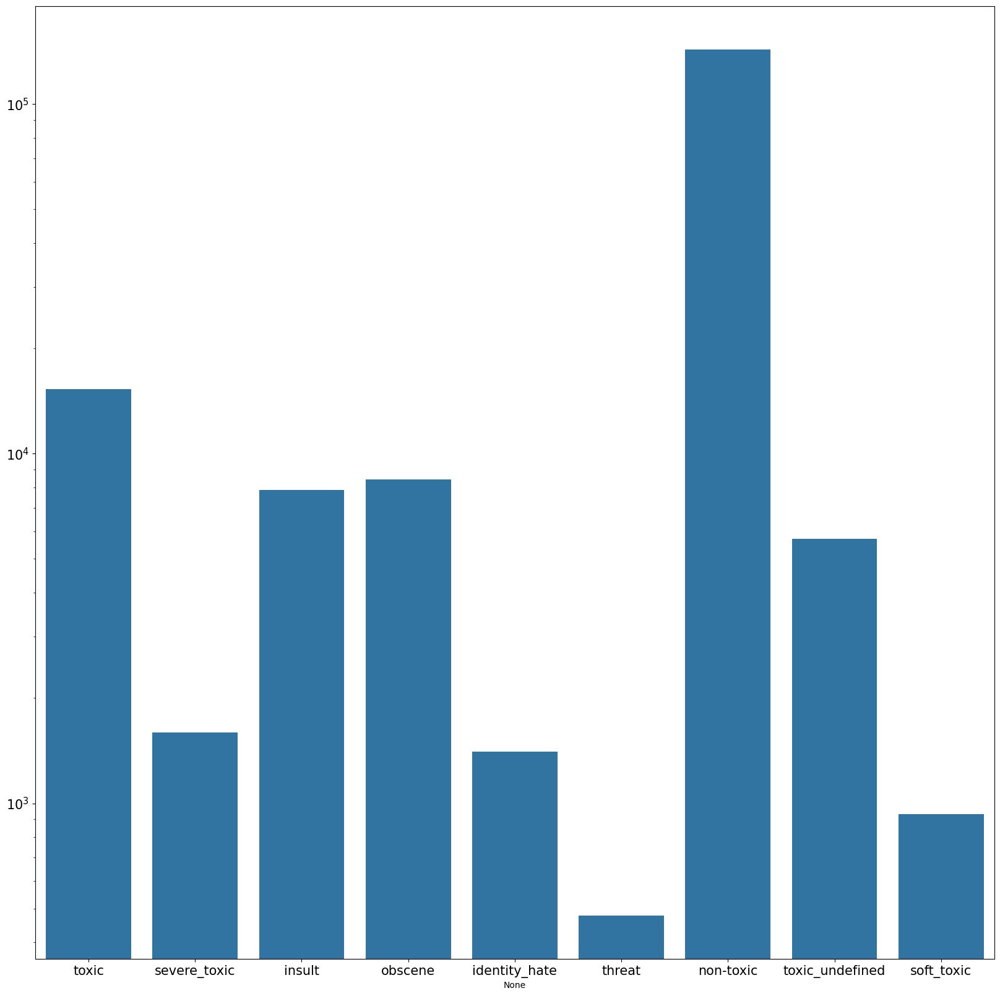

In [34]:
label_counts = train[analysis_columns].sum()
plt.figure(figsize=(20, 20))
ax = sns.barplot(x=label_counts.index, y=label_counts.values)
ax.set_yscale("log")
ax.tick_params(labelsize=15)

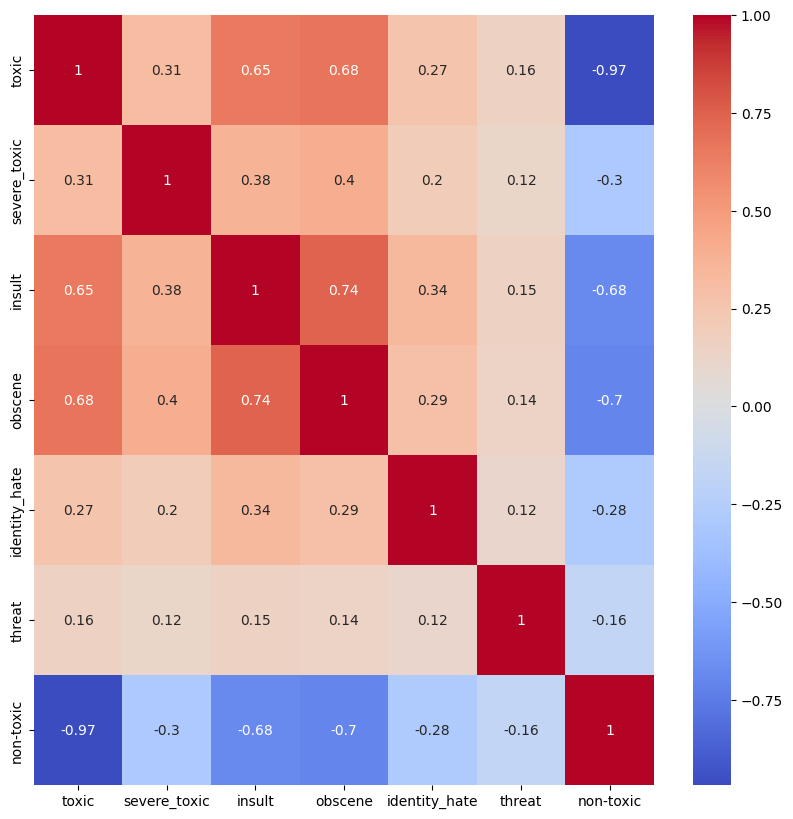

In [35]:
heatmap_data = train[target_columns]
plt.figure(figsize=(10, 10))
ax = sns.heatmap(heatmap_data.corr(), cmap='coolwarm', annot=True)
ax.tick_params(labelsize=10)

In [36]:
train.loc[train['severe_toxic']==1,'toxic'].sum()

1595

In [37]:
print(type(train))
print(train.columns)

<class 'pandas.core.frame.DataFrame'>
Index(['id', 'comment_text', 'toxic', 'severe_toxic', 'obscene', 'threat',
       'insult', 'identity_hate', 'non-toxic', 'toxicity_type_defined',
       'toxic_undefined', 'soft_toxic'],
      dtype='object')


In [38]:
# Define target_columns
target_columns = ['toxic', 'severe_toxic', 'insult','obscene','identity_hate','threat','non-toxic']

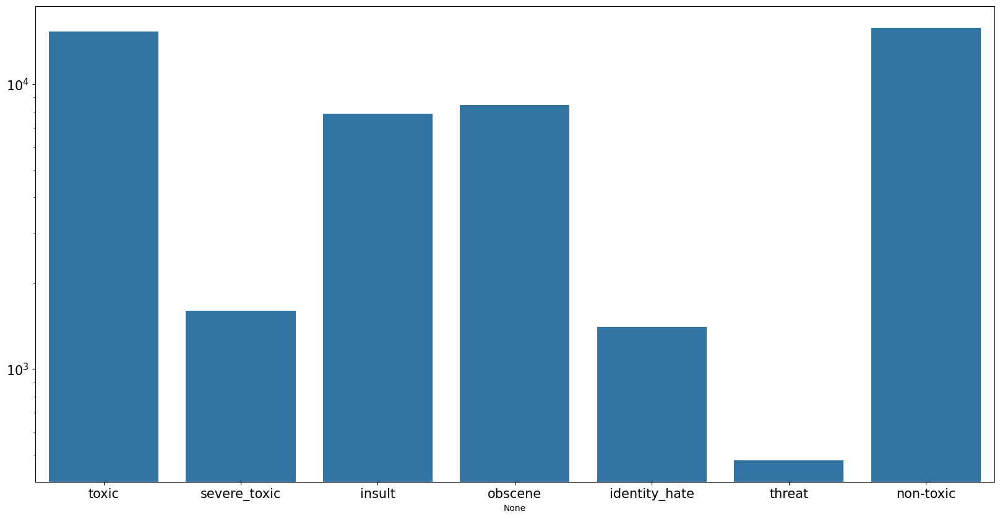

In [39]:
import pandas as pd

# Define train_balanced
train_balanced = pd.concat([train[train['non-toxic'] == 1].sample(frac=0.11), train.loc[train['non-toxic'] == 0]])

# Shuffle the DataFrame
train_balanced = train_balanced.sample(frac=1)

# Now you can proceed with using train_balanced and target_columns
label_counts = train_balanced[target_columns + ['non-toxic']].sum()
plt.figure(figsize=(20, 10))
ax = sns.barplot(x=label_counts.index, y=label_counts.values)
ax.set_yscale("log")
ax.tick_params(labelsize=15)

In [40]:
nlp = spacy.load('en_core_web_lg')

In [41]:
train_balanced.shape

(31993, 12)

In [42]:
train_balanced

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,non-toxic,toxicity_type_defined,toxic_undefined,soft_toxic
116252,6d84ad02916a1563,hey \n\nyour a gay nigger mother fucking cunt,1,0,1,0,1,1,0,1,0,0
72209,c14ea79bee1ee217,"""\n\n tb \n\n Better late than never. — - """,0,0,0,0,0,0,1,0,0,0
8180,15c24c7d65672c1b,"""\n\n""""The Big Show"""" IS the correct answer! A...",0,0,0,0,0,0,1,0,0,0
61812,a566cd002ba8efdf,You may want to review the notability guidelin...,0,0,0,0,0,0,1,0,0,0
68529,b75683744e6f82d0,"""* It is the editorial/auctorial """"we"""". See ...",0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
117581,74369a39d8cdecef,"""\n I should add, that this was also done by s...",1,0,0,0,0,0,0,0,1,0
47989,80379832c07986c1,Disagree: This crazy sonofabitch just condemne...,1,0,0,0,0,0,0,0,1,0
144291,0ae8f0f6cf10b81f,You know what you guys don't care about histor...,1,0,1,0,0,0,0,1,0,0
140468,efb40c053b4c4c18,"""\nUh, I withdrew from the race because it was...",0,0,0,0,0,0,1,0,0,0


In [43]:
all_tokens = []
lemmas = []
nonstop_tokens = []
total_number_of_tokens = []
number_of_sentences = []
number_of_puncts = []
glove_vector = []

for doc in nlp.pipe(train_balanced['comment_text'].astype('unicode').values, batch_size=50):
    if doc.has_annotation("DEP"):
        all_tokens.append([t.lower_ for t in doc])
        nonstop_tokens.append([t.lower_ for t in doc if t.is_alpha and not t.is_stop])
        lemmas.append([t.lemma_ for t in doc if t.is_alpha and not t.is_stop])
        total_number_of_tokens.append(doc.__len__())
        number_of_sentences.append(sum(1 for _ in doc.sents))
        number_of_puncts.append(sum(1 for t in doc if t.is_punct))
        glove_vector.append(doc.vector.tolist())
    else:
        all_tokens.append(None)
        nonstop_tokens.append(None)
        lemmas.append(None)
        total_number_of_tokens.append(None)
        number_of_sentences.append(None)
        number_of_puncts.append(None)
        glove_vector.append(None)

train_balanced['all_tokens'] = all_tokens
train_balanced['nonstop_tokens'] = nonstop_tokens
train_balanced['lemmas'] = lemmas
train_balanced['total_number_of_tokens'] = total_number_of_tokens
train_balanced['number_of_sentences'] = number_of_sentences
train_balanced['number_of_puncts'] = number_of_puncts
train_balanced['glove_vector'] = glove_vector

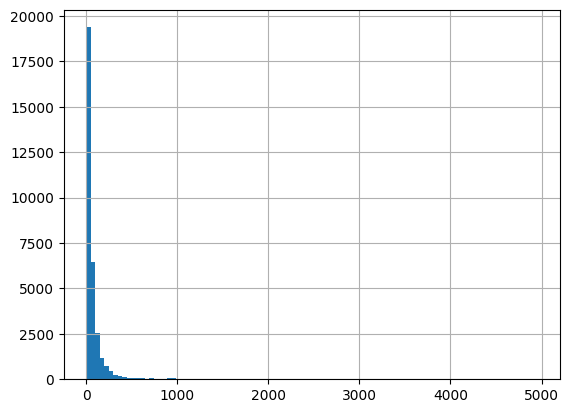

In [44]:
length = train_balanced['total_number_of_tokens']
length.hist(bins=100);

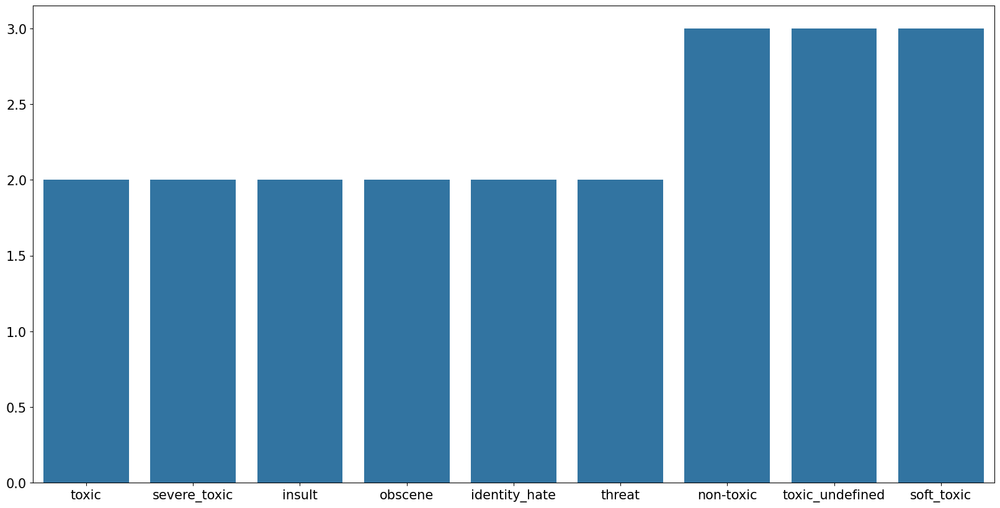

In [45]:
mc_length = []

for label in analysis_columns:
    mc_length.append(train_balanced.loc[train_balanced[label]==1,'number_of_sentences'].median())

plt.figure(figsize=(20, 10))
ax = sns.barplot(x=analysis_columns, y=mc_length)
ax.tick_params(labelsize=15)

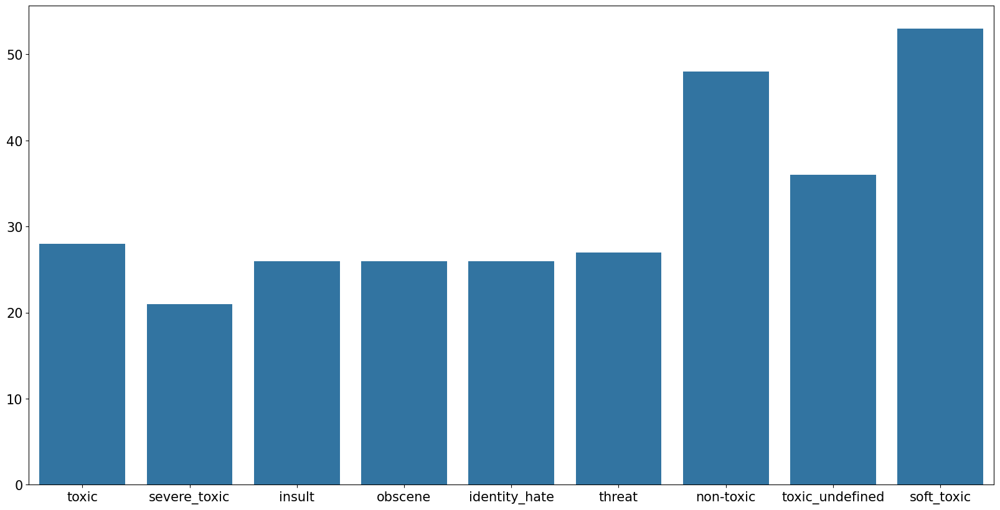

In [46]:
mc_length = []

for label in analysis_columns:
    mc_length.append(train_balanced.loc[train_balanced[label]==1,'total_number_of_tokens'].median())

plt.figure(figsize=(20, 10))
ax = sns.barplot(x=analysis_columns, y=mc_length)
ax.tick_params(labelsize=15)

In [47]:
log_max = np.log(train_balanced['total_number_of_tokens'].max())
train_balanced['log_tokens'] = train_balanced['total_number_of_tokens']**(1/log_max)
upper = train_balanced['log_tokens'].max()
train_balanced['log_tokens_normalised'] = (train_balanced['log_tokens'])/(upper)
#helpful_log_max_root = df.Helpful_Votes**(1/log_maxlog_max

In [48]:
train_balanced.loc[train_balanced['soft_toxic']==1]

,id,comment_text,toxic,severe_toxic,obscene,threat,insult,identity_hate,non-toxic,toxicity_type_defined,...,soft_toxic,all_tokens,nonstop_tokens,lemmas,total_number_of_tokens,number_of_sentences,number_of_puncts,glove_vector,log_tokens,log_tokens_normalised
72997,c34ab0a74f600462,"""\n\nEtymology of cunt\nIt appears that there ...",0,0,1,0,0,0,0,1,...,1,"["", \n\n, etymology, of, cunt, \n, it, appears...","[etymology, cunt, appears, etymologies, cunt, ...","[Etymology, cunt, appear, etymology, cunt, giv...",59,2,14,"[-1.1265822649002075, 1.8578706979751587, 0.03...",1.614956,0.594109
82871,ddbeffcd676cdf28,"Dolphins \n\nDamn, your Dolphins are active today",0,0,1,0,0,0,0,1,...,1,"[dolphins, \n\n, damn, ,, your, dolphins, are,...","[dolphins, damn, dolphins, active, today]","[dolphin, damn, Dolphins, active, today]",9,1,1,"[-0.9796021580696106, 0.7645344138145447, -1.3...",1.294701,0.476294
44960,7835bf5348f67ade,your time....\n\nYou suck because you are RIGH...,0,0,1,0,1,0,0,1,...,1,"[your, time, ...., \n\n, you, suck, because, y...","[time, suck, right, remember, lol, wanna, octo...","[time, suck, right, remember, lol, wanna, Octo...",42,5,8,"[0.2347353994846344, 2.0389742851257324, -2.83...",1.551709,0.570842
3233,08bb114239b4e0be,"""\n\nHonestly, I don't even remember making th...",0,0,1,0,1,0,0,1,...,1,"["", \n\n, honestly, ,, i, do, n't, even, remem...","[honestly, remember, making, edits, orlando, j...","[honestly, remember, make, edit, Orlando, Jord...",134,7,30,"[-0.9526222944259644, 2.1805622577667236, -2.1...",1.778433,0.654249
12206,2051aa41573cc411,the RepublicanSodomite has responded!!! praise...,0,0,0,0,1,0,0,1,...,1,"[the, republicansodomite, has, responded, !, !...","[republicansodomite, responded, praise, lord, ...","[RepublicanSodomite, respond, praise, lord, vi...",111,6,18,"[-0.9153814911842346, 1.6044920682907104, -2.0...",1.739499,0.639926
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88997,ee0cd9848d15c337,Gay Hatred \n\nAh I see you are a homophobe ju...,0,0,0,0,0,1,0,1,...,1,"[gay, hatred, \n\n, ah, i, see, you, are, a, h...","[gay, hatred, ah, homophobe, like, joakim, noa...","[Gay, hatre, ah, homophobe, like, Joakim, Noah...",37,3,2,"[-0.8705991506576538, 1.9667909145355225, -3.5...",1.528760,0.562400
21949,39d3d70f5acb6042,"""\n\n and let me add.... I'm getting sick and ...",0,0,0,0,1,0,0,1,...,1,"["", \n\n , and, let, me, add, ...., i, 'm, get...","[let, add, getting, sick, tired, scientificall...","[let, add, get, sick, tired, scientifically, i...",142,9,23,"[-0.9301407337188721, 0.8553917407989502, -2.6...",1.790597,0.658724
24026,3f73eced122a0758,"""\n\nI agree with your opinion. Such an ignora...",0,0,0,0,1,0,0,1,...,1,"["", \n\n, i, agree, with, your, opinion, ., su...","[agree, opinion, ignorant, person, like, exper...","[agree, opinion, ignorant, person, like, exper...",29,3,9,"[0.31690043210983276, 1.8257596492767334, 0.74...",1.485602,0.546522
56927,98230b6e403cf3c8,Silly guy. You should use email like the wikij...,0,0,0,0,1,0,0,1,...,1,"[silly, guy, ., you, should, use, email, like,...","[silly, guy, use, email, like, wikijews]","[silly, guy, use, email, like, wikijews]",11,2,2,"[-0.7591316103935242, -0.1890537142753601, -1....",1.325604,0.487663


C:\Users\USER\AppData\Local\Temp\ipykernel_32828\751271939.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
C:\Users\USER\AppData\Local\Temp\ipykernel_32828\751271939.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
C:\Users\USER\AppData\Local\Temp\ipykernel_32828\751271939.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)
C:\Users\USER\AppData\Local\Temp\ipykernel_32828\751271939.py:10: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(),rotation = 

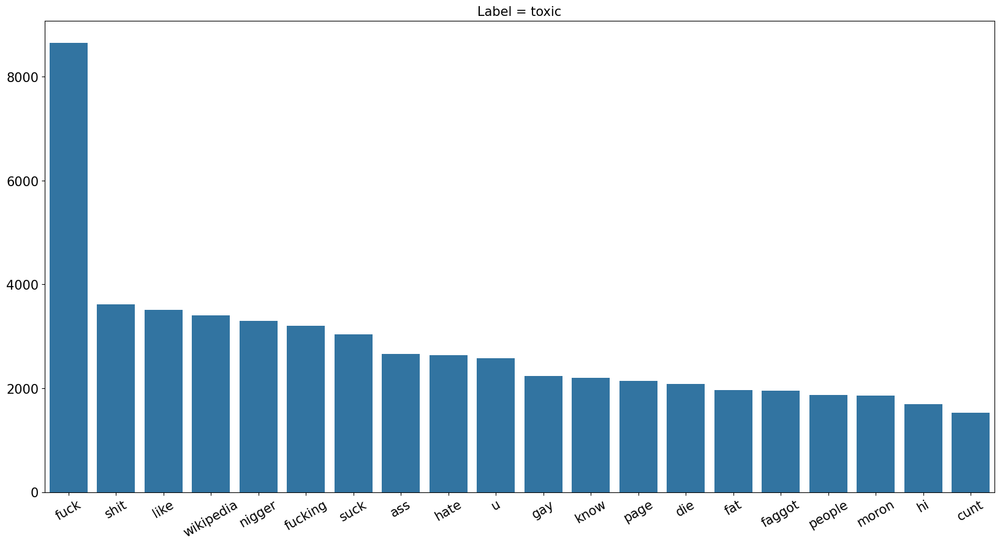

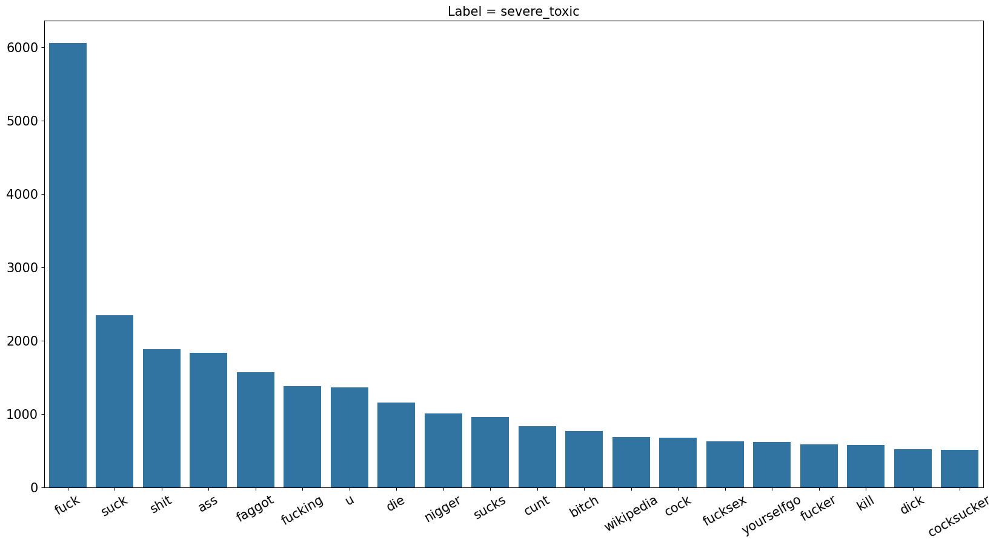

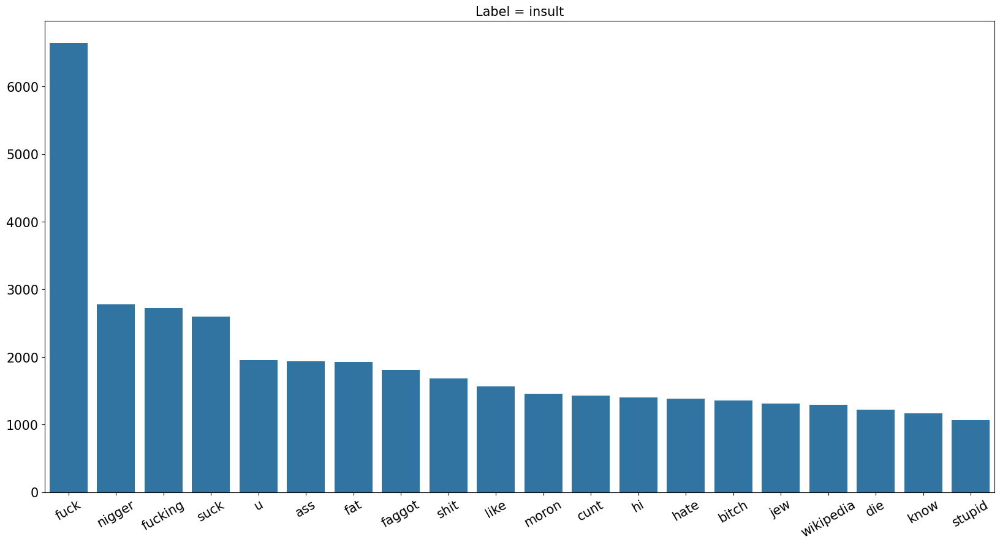

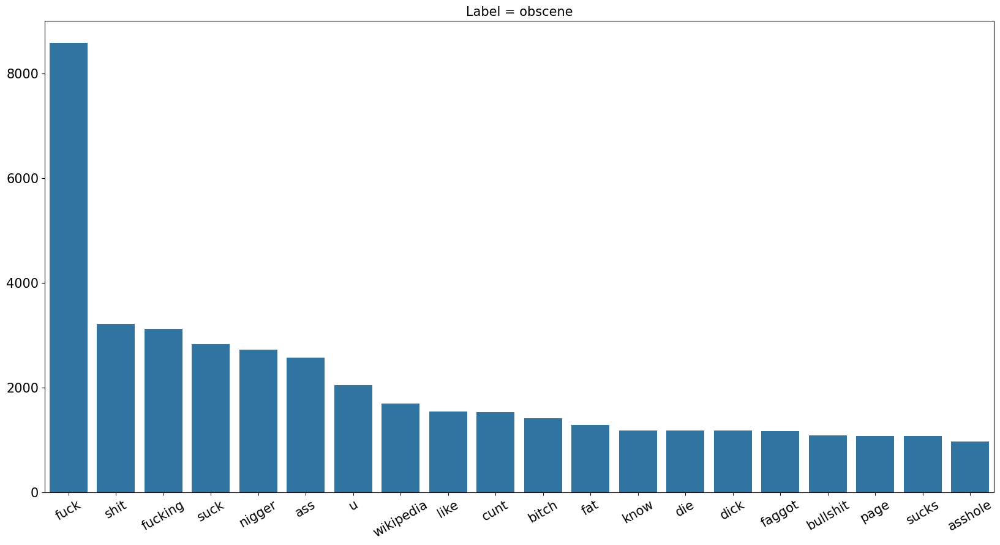

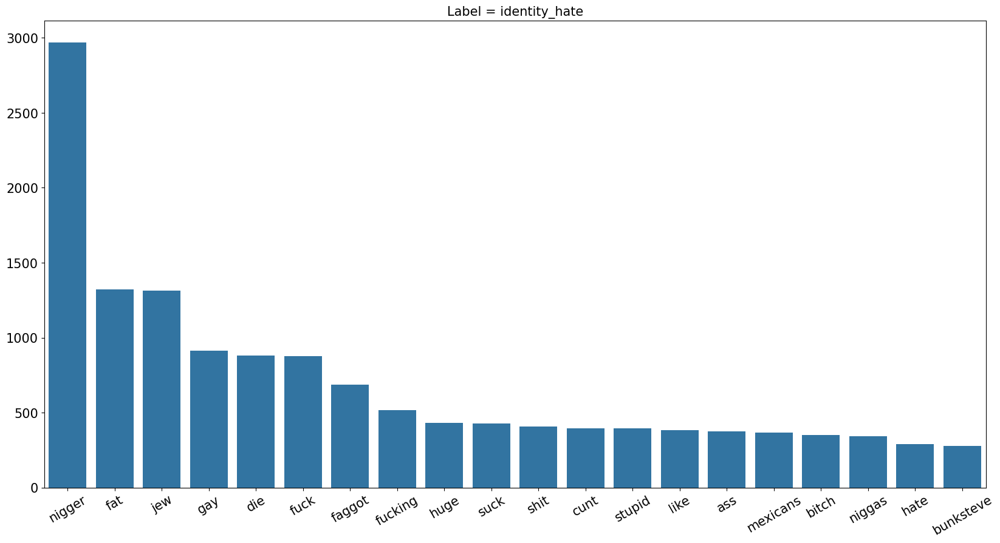

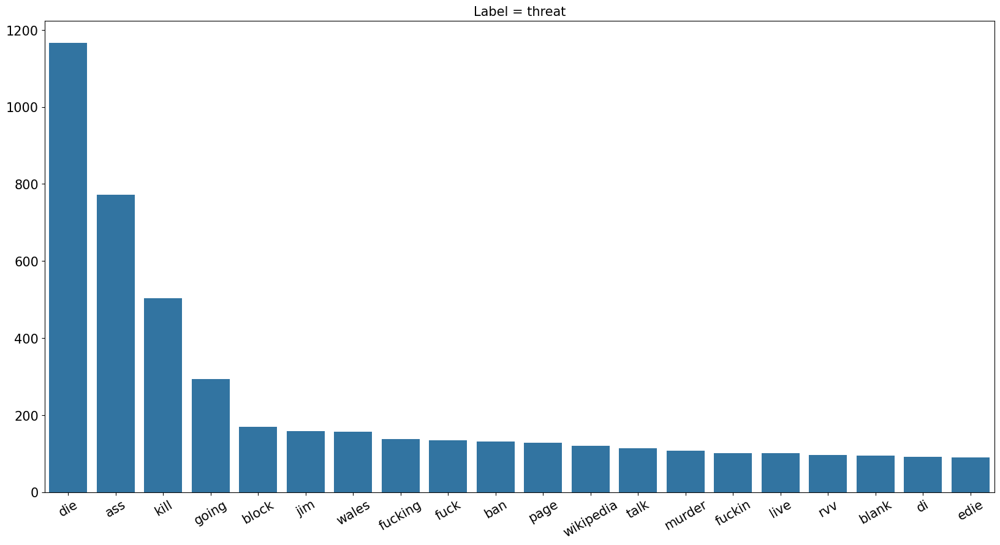

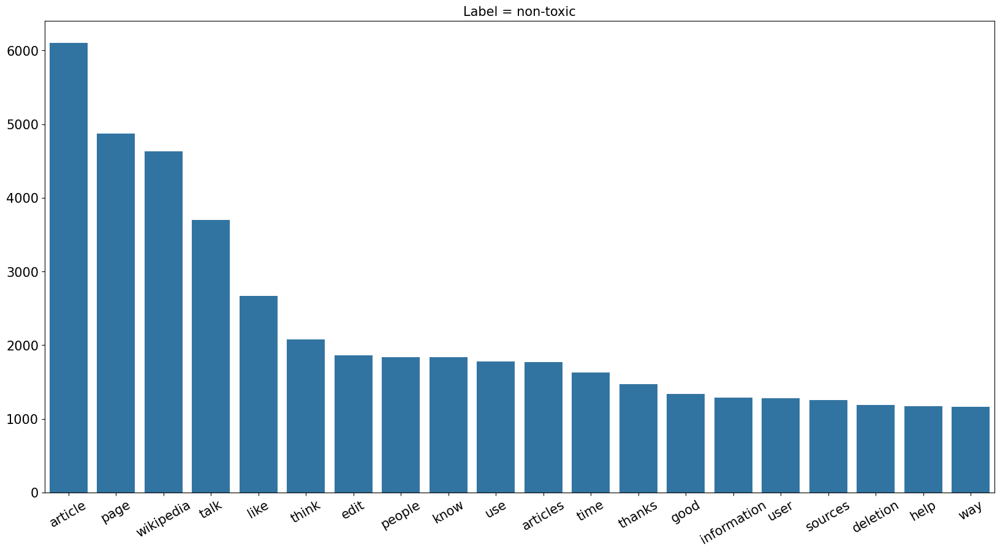

In [49]:
for label in target_columns:
    word_list = list(train_balanced.loc[train_balanced[label]==1, 'nonstop_tokens'].explode())
    most_common = collections.Counter(word_list).most_common(20)
    words = [w for w,_ in most_common]
    counts = [c for _,c in most_common]
    plt.figure(figsize=(20, 10))
    ax = sns.barplot(x=words, y=counts)
    ax.set_title(f'Label = {label}', fontsize=15)
    ax.tick_params(labelsize=15)
    ax.set_xticklabels(ax.get_xticklabels(),rotation = 30)

In [50]:
val_border = int(len(train_balanced)*0.6)
validation_set = train_balanced[val_border:].copy()

In [70]:
validation_set.count()

id                        12798
comment_text              12798
toxic                     12798
severe_toxic              12798
obscene                   12798
threat                    12798
insult                    12798
identity_hate             12798
non-toxic                 12798
toxicity_type_defined     12798
toxic_undefined           12798
soft_toxic                12798
all_tokens                12798
nonstop_tokens            12798
lemmas                    12798
total_number_of_tokens    12798
number_of_sentences       12798
number_of_puncts          12798
glove_vector              12798
log_tokens                12798
log_tokens_normalised     12798
dtype: int64

In [68]:
val_border

19195

In [52]:
compare_set = ['toxic', 'insult', 'obscene']

In [53]:
vectorizer = TfidfVectorizer(ngram_range=(1, 5), max_features=5000)
vectorizer.fit(train_balanced['comment_text'])
vectorizer

TfidfVectorizer(max_features=5000, ngram_range=(1, 5))

In [54]:
vectorizer.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.float64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 5),
 'norm': 'l2',
 'preprocessor': None,
 'smooth_idf': True,
 'stop_words': None,
 'strip_accents': None,
 'sublinear_tf': False,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'use_idf': True,
 'vocabulary': None}

In [55]:
x_train = vectorizer.transform(train_balanced['comment_text'])

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import LinearSVC
svm_model = OneVsRestClassifier(LinearSVC(random_state=42, max_iter=1000))

In [ ]:
vectorizer = TfidfVectorizer(ngram_range=(1, 3), max_features=10000, min_df=2, max_df=0.7)
vectorizer.fit(train['comment_text'])
vectorizer.get_params()

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.float64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 0.7,
 'max_features': 10000,
 'min_df': 2,
 'ngram_range': (1, 3),
 'norm': 'l2',
 'preprocessor': None,
 'smooth_idf': True,
 'stop_words': None,
 'strip_accents': None,
 'sublinear_tf': False,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'use_idf': True,
 'vocabulary': None}

In [ ]:
svm_model.fit(x_train, train[target_columns])
test[target_columns] = svm_model.predict(x_test)

c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dua

In [ ]:
print(train_balanced.columns)

In [ ]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, accuracy_score

# Assuming 'train_balanced' and 'validation_set' are properly preprocessed
X_train = train_balanced['glove_vector'].to_list()[:val_border]
y_train = train_balanced[target_columns][:val_border]  # Ensure this is a single column with multiclass labels
X_val = train_balanced['glove_vector'].to_list()[val_border:]
y_val = validation_set[target_columns]

# Train the model
svm_model.fit(X_train, y_train)

# Predict on the validation set
y_val_pred = svm_model.predict(X_val)



c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_base.py:1237: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-package

               precision    recall  f1-score   support

        toxic       0.91      0.70      0.79      6096
 severe_toxic       0.47      0.12      0.20       658
       insult       0.44      0.84      0.58      3130
      obscene       0.67      0.68      0.67      3397
identity_hate       0.42      0.11      0.18       574
       threat       0.50      0.16      0.24       182
    non-toxic       0.73      0.94      0.82      6323

    micro avg       0.68      0.75      0.71     20360
    macro avg       0.59      0.51      0.50     20360
 weighted avg       0.71      0.75      0.71     20360
  samples avg       0.69      0.78      0.71     20360



In [ ]:
from sklearn.metrics import accuracy_score
print(classification_report(validation_set[target_columns], y_val_pred, target_names=['toxic', 'severe_toxic', 'insult', 'obscene', 'identity_hate', 'threat', 'non-toxic'], zero_division=0))
print(f'AUC: {roc_auc_score(validation_set[target_columns], y_val_pred)}')
average_roc += roc_auc_score(validation_set[target_columns], y_val_pred)
y_val_flat = validation_set[target_columns].values.ravel()
y_val_pred_flat = y_val_pred.ravel()
accuracy = accuracy_score(y_val_flat, y_val_pred_flat)
print(f'Overall accuracy: {accuracy:.2f}')

               precision    recall  f1-score   support

        toxic       0.91      0.70      0.79      6096
 severe_toxic       0.47      0.12      0.20       658
       insult       0.44      0.84      0.58      3130
      obscene       0.67      0.68      0.67      3397
identity_hate       0.42      0.11      0.18       574
       threat       0.50      0.16      0.24       182
    non-toxic       0.73      0.94      0.82      6323

    micro avg       0.68      0.75      0.71     20360
    macro avg       0.59      0.51      0.50     20360
 weighted avg       0.71      0.75      0.71     20360
  samples avg       0.69      0.78      0.71     20360

AUC: 0.690209896214827
Overall accuracy: 0.86


In [ ]:
target_columns

['toxic',
 'severe_toxic',
 'insult',
 'obscene',
 'identity_hate',
 'threat',
 'non-toxic']

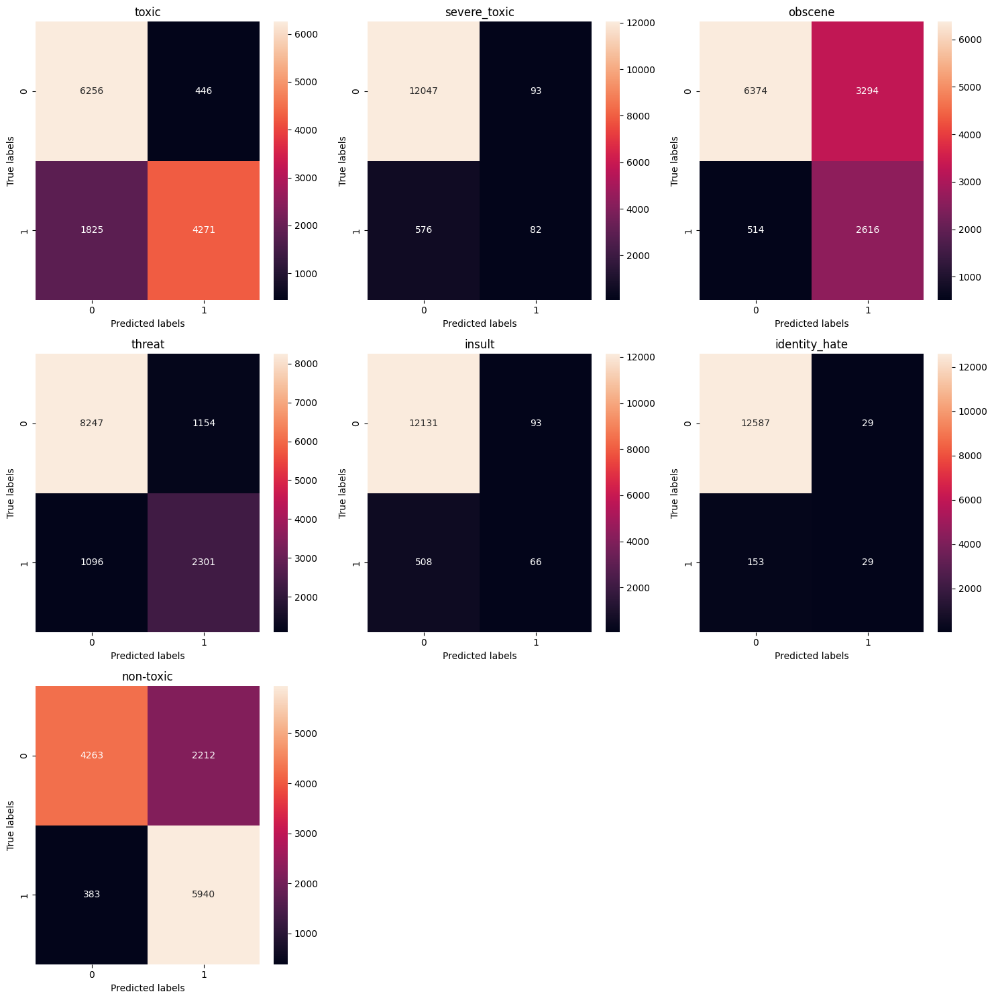

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import multilabel_confusion_matrix

# Assuming y_val and y_val_pred are already defined as the true and predicted labels

# Calculate the confusion matrix for each class
conf_matrices = multilabel_confusion_matrix(validation_set[target_columns], y_val_pred)

# Define the label names
label_names = ['toxic', 'severe_toxic', 'obscene', 'threat', 'insult', 'identity_hate', 'non-toxic']  # List all your labels here

# Set up the matplotlib figure and axes, one for each confusion matrix
fig, axes = plt.subplots(3, 3, figsize=(15, 15))  # Adjust the size as needed
axes = axes.flatten()  # Flatten the 2D array of axes to 1D, if necessary

# Plot each confusion matrix
for i, (label, matrix) in enumerate(zip(label_names, conf_matrices)):
    sns.heatmap(matrix, annot=True, fmt='d', ax=axes[i])
    axes[i].set_title(label)
    axes[i].set_xlabel('Predicted labels')
    axes[i].set_ylabel('True labels')

# If you have less than 9 matrices (as 3x3=9), you'll need to hide the empty subplots
for i in range(len(label_names), len(axes)):
    axes[i].set_visible(False)  # Hide the subplot if no confusion matrix is associated

plt.tight_layout()  # Adjust the padding between and around subplots
plt.show()


In [ ]:
x_train = vectorizer.transform(train['comment_text'])
x_test = vectorizer.transform(test['comment_text'])

In [ ]:
for label in target_columns:
    svm_model.fit(x_train, train[label])
    test[label] = svm_model.predict(x_test)  # No need for [:,1]


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dual` explicitly to suppress the warning.
  warnings.warn(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\svm\_classes.py:31: FutureWarning: The default value of `dual` will change from `True` to `'auto'` in 1.5. Set the value of `dua

In [ ]:
test[sample.columns.to_list()].to_csv('mlp_submission.csv', index=False)

In [ ]:
test.head()

,id,comment_text,toxic,severe_toxic,insult,obscene,identity_hate,threat,non-toxic
0,00001cee341fdb12,Yo bitch Ja Rule is more succesful then you'll...,1,0,1,1,0,0,0
1,0000247867823ef7,== From RfC == \n\n The title is fine as it is...,0,0,0,0,0,0,1
2,00013b17ad220c46,""" \n\n == Sources == \n\n * Zawe Ashton on Lap...",0,0,0,0,0,0,1
3,00017563c3f7919a,":If you have a look back at the source, the in...",0,0,0,0,0,0,1
4,00017695ad8997eb,I don't anonymously edit articles at all.,0,0,0,0,0,0,1


In [ ]:
test.loc[test['id'] == '00260d8dfcc29827']


,id,comment_text,toxic,severe_toxic,insult,obscene,identity_hate,threat,non-toxic
99,00260d8dfcc29827,Stone Sour sucks anus,1,0,0,1,0,0,0


In [ ]:
from sklearn.linear_model import LogisticRegression

In [57]:
x_train[:val_border]

<19195x5000 sparse matrix of type '<class 'numpy.float64'>'
	with 786582 stored elements in Compressed Sparse Row format>

In [61]:
from sklearn.linear_model import LogisticRegression
from sklearn.multiclass import OneVsRestClassifier

# Initialize the logistic regression model
lr_classifier = LogisticRegression()

# Wrap the classifier with OneVsRestClassifier for multi-label classification
ovr_classifier = OneVsRestClassifier(lr_classifier)

lr_X_train = train_balanced['glove_vector'].to_list()[:val_border]
lr_Y_train = train_balanced[target_columns][:val_border]  # Ensure this is a single column with multiclass labels
lr_X_val = train_balanced['glove_vector'].to_list()[val_border:]
lr_y_val = validation_set[target_columns]

# Fit the classifier on the training data
# Assuming 'x_train' is your feature matrix and 'train_balanced[target_columns]' is your multi-label target
ovr_classifier.fit(lr_X_train,lr_Y_train)

# Now you can use ovr_classifier to make predictions and evaluate the model


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stab

OneVsRestClassifier(estimator=LogisticRegression())

In [63]:
lr_y_val_pred = ovr_classifier.predict(lr_X_val)

In [71]:
lr_X_train

[[-0.13066771626472473,
  2.435802698135376,
  -3.7086448669433594,
  0.5425422191619873,
  1.1471964120864868,
  1.0038193464279175,
  -0.28316885232925415,
  2.118886709213257,
  -0.12425223737955093,
  1.8291443586349487,
  4.194446086883545,
  1.821928858757019,
  -1.8605055809020996,
  0.9860922694206238,
  1.8107354640960693,
  0.4911800026893616,
  1.0589611530303955,
  -1.3268022537231445,
  -1.3998210430145264,
  0.6716753840446472,
  1.2203733921051025,
  1.1436620950698853,
  0.026725543662905693,
  -2.947815418243408,
  0.5361722111701965,
  -2.6011035442352295,
  -1.7426365613937378,
  -0.4689089059829712,
  0.245097815990448,
  -1.5870388746261597,
  0.7240877747535706,
  -0.7560555934906006,
  -0.013559963554143906,
  0.1660800278186798,
  -1.0457878112792969,
  2.0801045894622803,
  1.0701978206634521,
  -0.8876644372940063,
  2.3645517826080322,
  -1.6260454654693604,
  -1.7489712238311768,
  -1.6801189184188843,
  1.0262422561645508,
  -1.0180844068527222,
  0.8924477

In [76]:
print('Logistic Regression')
from sklearn.metrics import accuracy_score
print(classification_report(validation_set[target_columns], lr_y_val_pred, target_names=['toxic', 'severe_toxic', 'insult', 'obscene', 'identity_hate', 'threat', 'non-toxic'], zero_division=0))
print(f'AUC: {roc_auc_score(validation_set[target_columns], lr_y_val_pred)}')
lr_y_val_flat = validation_set[target_columns].values.ravel()
lr_y_val_pred_flat = lr_y_val_pred.ravel()
accuracy = accuracy_score(lr_y_val_flat, lr_y_val_pred_flat)
print(f'Overall accuracy: {accuracy:.2f}')

Logistic Regression
               precision    recall  f1-score   support

        toxic       0.87      0.82      0.85      6111
 severe_toxic       0.48      0.20      0.29       632
       insult       0.72      0.50      0.59      3154
      obscene       0.78      0.61      0.69      3314
identity_hate       0.45      0.11      0.17       563
       threat       0.41      0.21      0.28       197
    non-toxic       0.86      0.90      0.88      6317

    micro avg       0.82      0.72      0.77     20288
    macro avg       0.65      0.48      0.53     20288
 weighted avg       0.80      0.72      0.75     20288
  samples avg       0.80      0.76      0.76     20288

AUC: 0.7107678394047582
Overall accuracy: 0.90


In [72]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.multiclass import OneVsRestClassifier

# Initialize the KNN model
knn_classifier = KNeighborsClassifier(n_neighbors=3)  # You can choose the best value for n_neighbors

# Wrap the classifier with OneVsRestClassifier for multi-label classification
ovr_knn = OneVsRestClassifier(knn_classifier)

knn_X_train = train_balanced['glove_vector'].to_list()[:val_border]
knn_Y_train = train_balanced[target_columns][:val_border]  # Ensure this is a single column with multiclass labels
knn_X_val = train_balanced['glove_vector'].to_list()[val_border:]
knn_y_val = validation_set[target_columns]

# Fit the classifier on the training data
# Assuming 'x_train' is your feature matrix and 'train_balanced[target_columns]' is your multi-label target
ovr_knn.fit(knn_X_train,knn_Y_train)

# Predict on your test set
y_pred_knn = ovr_knn.predict(knn_X_val)  # Make sure x_test is processed the same way as x_train


In [75]:
print('KNN')
print(classification_report(validation_set[target_columns], y_pred_knn, target_names=['toxic', 'severe_toxic', 'insult', 'obscene', 'identity_hate', 'threat', 'non-toxic'], zero_division=0))
print(f'AUC: {roc_auc_score(validation_set[target_columns], y_pred_knn)}')
knn_y_val_flat = validation_set[target_columns].values.ravel()
knn_y_val_pred_flat = y_pred_knn.ravel()
accuracy = accuracy_score(knn_y_val_flat, knn_y_val_pred_flat)
print(f'Overall accuracy: {accuracy:.2f}')

KNN
               precision    recall  f1-score   support

        toxic       0.75      0.77      0.76      6111
 severe_toxic       0.30      0.18      0.22       632
       insult       0.54      0.50      0.52      3154
      obscene       0.55      0.55      0.55      3314
identity_hate       0.20      0.07      0.11       563
       threat       0.31      0.08      0.12       197
    non-toxic       0.79      0.74      0.76      6317

    micro avg       0.68      0.64      0.66     20288
    macro avg       0.49      0.41      0.44     20288
 weighted avg       0.66      0.64      0.65     20288
  samples avg       0.68      0.67      0.65     20288

AUC: 0.6520337183732038
Overall accuracy: 0.85
